### 0. Prerequisities

In [15]:
import numpy as np
import pandas as pd
import pandas_ta as ta
from matplotlib import pyplot as plt
import plotly.graph_objects as go
from dateutil.relativedelta import relativedelta
import seaborn as sns
from scipy.stats import norm, shapiro, jarque_bera, probplot, t, kstest
from joblib import dump, load
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
import optuna
import torch
import torch.nn as nn
import torch.optim as optim
from NeuralNetworks import LSTM, GRU
import json
from tqdm import tqdm
import DataPreprocessing as dp
from ManualScalar import ManualMinMaxScalar

import warnings
warnings.filterwarnings("ignore")

### 1. Data Preprocessing & Moving Window Method

+ Data Loading

In [3]:
data = pd.read_excel("Pro3_Stage1_SP25.xlsx", index_col=0)
data.head()

,Price
Date,
2022-01-01,57.491
2022-01-02,59.004
2022-01-03,59.601
2022-01-04,58.400
2022-01-05,58.424


In [4]:
data.index = pd.to_datetime(data.index)

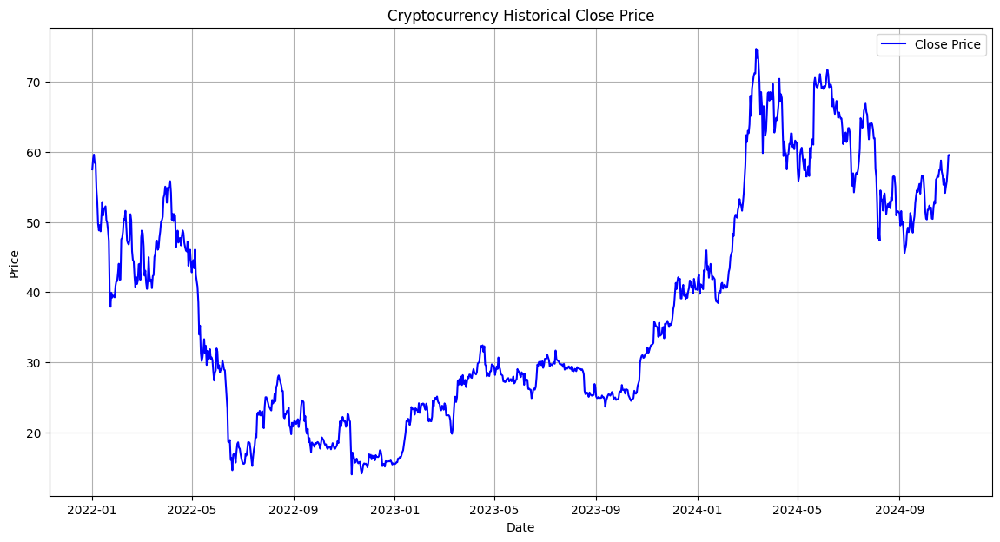

In [4]:
plt.figure(figsize=(14, 7))
plt.plot(data.index, data["Price"], label="Close Price", color="blue")
plt.title("Cryptocurrency Historical Close Price")
plt.xlabel("Date")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.show()

In [10]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=data.index,
    y=data['Price'],
    mode='lines',
    name='Close Price',
    line=dict(color='blue')
))

fig.update_layout(
    title='Cryptocurrency Historical Close Price',
    xaxis_title='Date',
    yaxis_title='Price',
    template='plotly_white',
    hovermode='x unified'
)

fig.show()

+ Add some technical indicators

Simple Moving Average, SMA

In [5]:
data["SMA_7"] = ta.sma(data["Price"], length=7)
data["SMA_30"] = ta.sma(data["Price"], length=30)

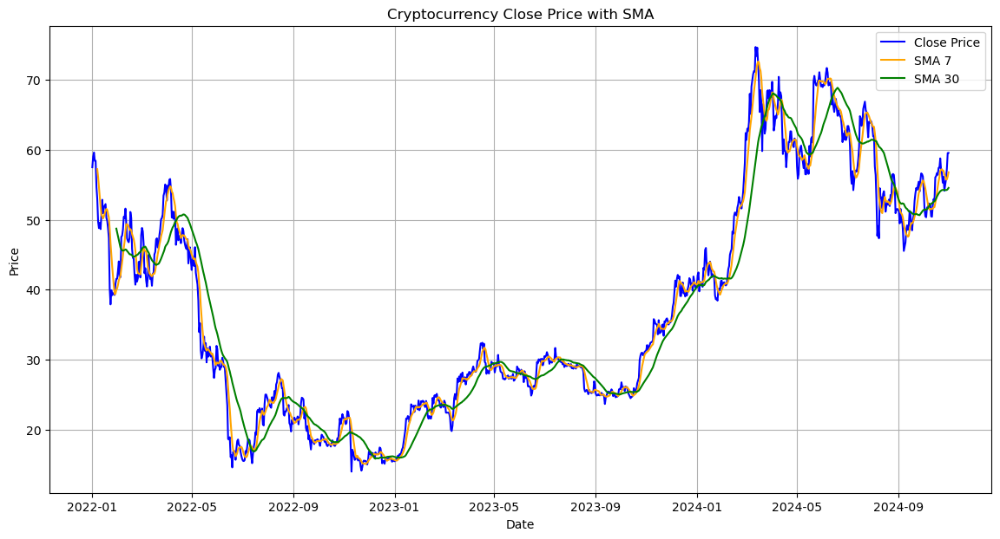

In [14]:
plt.figure(figsize=(14, 7))
plt.plot(data.index, data["Price"], label="Close Price", color="blue")
plt.plot(data.index, data["SMA_7"], label="SMA 7", color="orange")
plt.plot(data.index, data["SMA_30"], label="SMA 30", color="green")
plt.title("Cryptocurrency Close Price with SMA")
plt.xlabel("Date")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.show()

In [15]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=data.index, y=data["Price"], mode='lines', name='Close Price', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=data.index, y=data["SMA_7"], mode='lines', name='SMA 7', line=dict(color='orange')))
fig.add_trace(go.Scatter(x=data.index, y=data["SMA_30"], mode='lines', name='SMA 30', line=dict(color='green')))

fig.update_layout(
    title="Cryptocurrency Close Price with SMA",
    xaxis_title="Date",
    yaxis_title="Price",
    template="plotly_white",
    hovermode="x unified"
)

fig.show()

Relative Strength Index, RSI

In [6]:
data["RSI_14"] = ta.rsi(data["Price"], length=14)

In [18]:
overbought = data["RSI_14"] > 70
oversold = data["RSI_14"] < 30

def get_zones(mask):
    zones = []
    in_zone = False
    start = None
    for date, val in mask.items():
        if val and not in_zone:
            start = date
            in_zone = True
        elif not val and in_zone:
            end = date
            zones.append((start, end))
            in_zone = False
    if in_zone:
        zones.append((start, mask.index[-1]))
    return zones

overbought_zones = get_zones(overbought)
oversold_zones = get_zones(oversold)

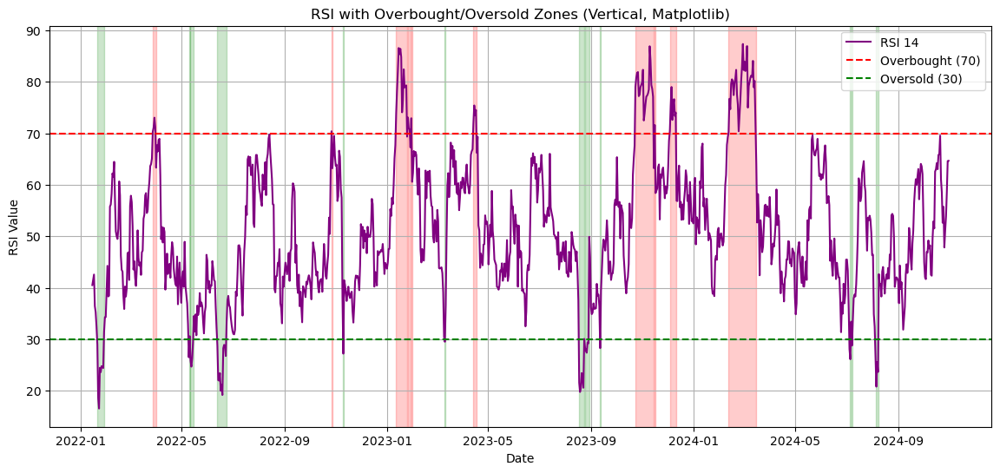

In [19]:
plt.figure(figsize=(14, 6))
plt.plot(data.index, data["RSI_14"], label="RSI 14", color="purple")
plt.axhline(70, color='red', linestyle='--', label='Overbought (70)')
plt.axhline(30, color='green', linestyle='--', label='Oversold (30)')

for start, end in overbought_zones:
    plt.axvspan(start, end, color='red', alpha=0.2)

for start, end in oversold_zones:
    plt.axvspan(start, end, color='green', alpha=0.2)

plt.title("RSI with Overbought/Oversold Zones")
plt.xlabel("Date")
plt.ylabel("RSI Value")
plt.legend()
plt.grid(True)
plt.show()

In [20]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=data.index, y=data["RSI_14"], mode='lines', name='RSI 14', line=dict(color='purple')))
fig.add_hline(y=70, line=dict(color='red', dash='dash'), annotation_text="Overbought (70)", annotation_position="top left")
fig.add_hline(y=30, line=dict(color='green', dash='dash'), annotation_text="Oversold (30)", annotation_position="bottom left")

for start, end in overbought_zones:
    fig.add_shape(type="rect",
                  xref="x", yref="y",
                  x0=start, x1=end, y0=0, y1=100,
                  fillcolor="red", opacity=0.2, line_width=0)

for start, end in oversold_zones:
    fig.add_shape(type="rect",
                  xref="x", yref="y",
                  x0=start, x1=end, y0=0, y1=100,
                  fillcolor="green", opacity=0.2, line_width=0)

fig.update_layout(
    title="RSI with Overbought/Oversold Zones",
    xaxis_title="Date",
    yaxis_title="RSI Value",
    template="plotly_white",
    hovermode="x unified"
)

fig.show()

Moving Average Convergence/Divergence, MACD

In [7]:
macd = ta.macd(data["Price"], fast=12, slow=26, signal=9)
data["MACD"] = macd["MACD_12_26_9"]
MACD_Signal = macd["MACDs_12_26_9"]
MACD_Hist = macd["MACDh_12_26_9"]
data["MACD_Hist"] = MACD_Hist

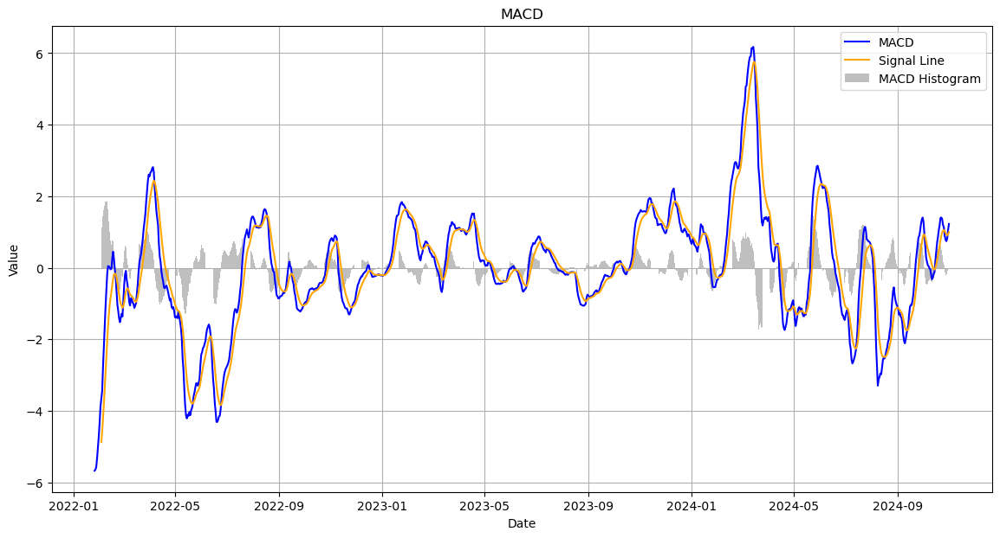

In [23]:
plt.figure(figsize=(14,7))
plt.plot(data.index, data["MACD"], label="MACD", color="blue")
plt.plot(data.index, MACD_Signal, label="Signal Line", color="orange")
plt.bar(data.index, MACD_Hist, label="MACD Histogram", color="gray", alpha=0.5)

plt.title("MACD")
plt.xlabel("Date")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

In [24]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=data.index, y=data["MACD"], mode='lines', name='MACD', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=data.index, y=MACD_Signal, mode='lines', name='Signal Line', line=dict(color='orange')))
fig.add_trace(go.Bar(x=data.index, y=MACD_Hist, name='MACD Histogram', marker_color='gray', opacity=0.5))

fig.update_layout(
    title="MACD",
    xaxis_title="Date",
    yaxis_title="MACD Value",
    template="plotly_white",
    hovermode="x unified"
)

fig.show()

Bollinger Bands, BB

In [8]:
bb = ta.bbands(data["Price"], length=14, std=2)
data["BB_upper"] = bb["BBU_14_2.0"]
data["BB_middle"] = bb["BBM_14_2.0"]
data["BB_lower"] = bb["BBL_14_2.0"]

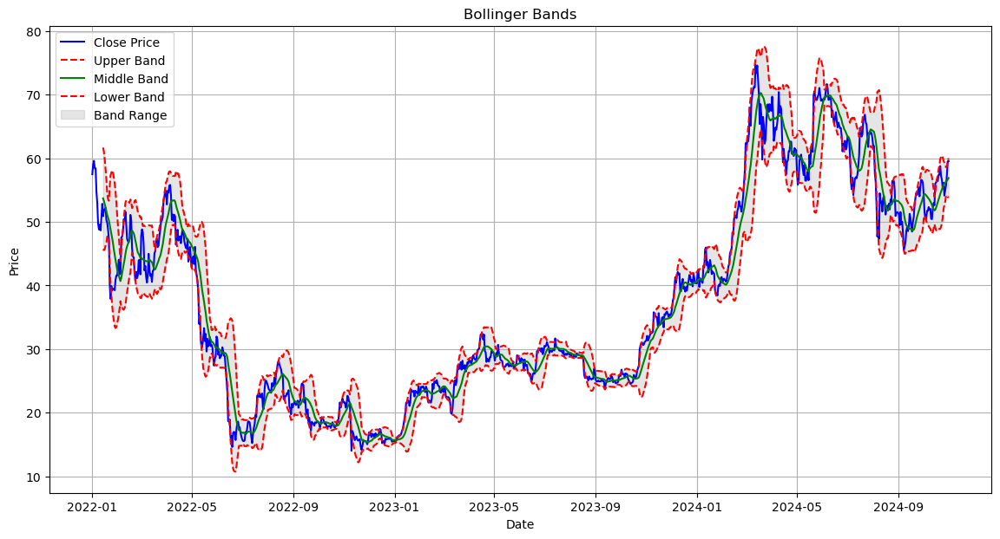

In [27]:
plt.figure(figsize=(14, 7))
plt.plot(data.index, data["Price"], label="Close Price", color="blue")
plt.plot(data.index, data["BB_upper"], label="Upper Band", color="red", linestyle='--')
plt.plot(data.index, data["BB_middle"], label="Middle Band", color="green", linestyle='-')
plt.plot(data.index, data["BB_lower"], label="Lower Band", color="red", linestyle='--')
plt.fill_between(data.index, data["BB_lower"], data["BB_upper"], color='gray', alpha=0.2, label="Band Range")

plt.title("Bollinger Bands")
plt.xlabel("Date")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.show()

In [28]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=data.index, y=data["Price"], mode='lines', name='Close Price', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=data.index, y=data["BB_upper"], mode='lines', name='Upper Band', line=dict(color='red', dash='dash')))
fig.add_trace(go.Scatter(x=data.index, y=data["BB_middle"], mode='lines', name='Middle Band', line=dict(color='green')))
fig.add_trace(go.Scatter(x=data.index, y=data["BB_lower"], mode='lines', name='Lower Band', line=dict(color='red', dash='dash')))

fig.add_trace(go.Scatter(
    x=data.index.to_list() + data.index[::-1].to_list(),
    y=data["BB_upper"].to_list() + data["BB_lower"][::-1].to_list(),
    fill='toself',
    fillcolor='rgba(128, 128, 128, 0.2)',
    line=dict(color='rgba(255,255,255,0)'),
    hoverinfo="skip",
    showlegend=True,
    name="Band Range"
))

fig.update_layout(
    title="Bollinger Bands",
    xaxis_title="Date",
    yaxis_title="Price",
    template="plotly_white",
    hovermode="x unified"
)

fig.show()

Stochastic Oscillator, SO

In [9]:
stoch = ta.stoch(data["Price"], data["Price"], data["Price"], k=14, d=3)
data["Stoch_K"] = stoch["STOCHk_14_3_3"]
data["Stoch_D"] = stoch["STOCHd_14_3_3"]

In [31]:
overbought = data["Stoch_K"] > 80
oversold = data["Stoch_K"] < 20

overbought_zones = get_zones(overbought)
oversold_zones = get_zones(oversold)

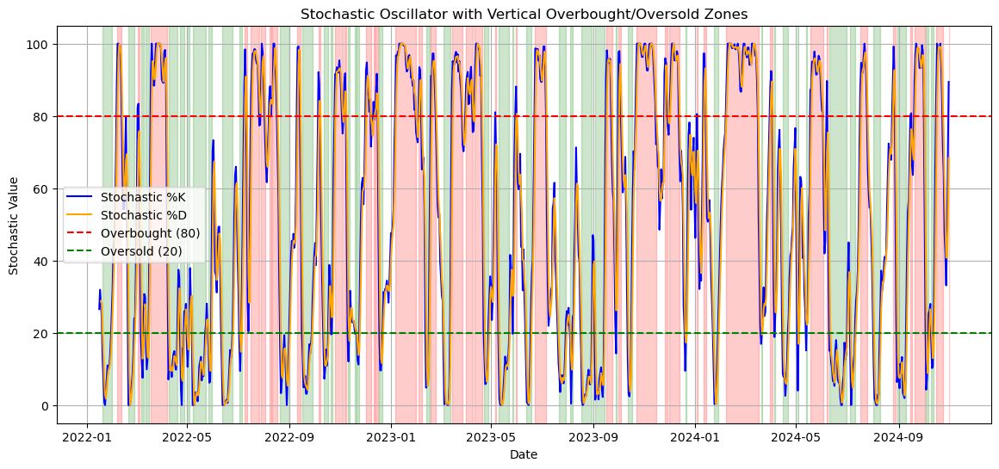

In [32]:
plt.figure(figsize=(14, 6))
plt.plot(data.index, data["Stoch_K"], label="Stochastic %K", color="blue")
plt.plot(data.index, data["Stoch_D"], label="Stochastic %D", color="orange")
plt.axhline(80, color='red', linestyle='--', label='Overbought (80)')
plt.axhline(20, color='green', linestyle='--', label='Oversold (20)')

for start, end in overbought_zones:
    plt.axvspan(start, end, color='red', alpha=0.2)

for start, end in oversold_zones:
    plt.axvspan(start, end, color='green', alpha=0.2)

plt.title("Stochastic Oscillator with Vertical Overbought/Oversold Zones")
plt.xlabel("Date")
plt.ylabel("Stochastic Value")
plt.legend()
plt.grid(True)
plt.show()

In [33]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=data.index, y=data["Stoch_K"], mode='lines', name='Stochastic %K', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=data.index, y=data["Stoch_D"], mode='lines', name='Stochastic %D', line=dict(color='orange')))

fig.add_hline(y=80, line=dict(color='red', dash='dash'), annotation_text="Overbought (80)", annotation_position="top left")
fig.add_hline(y=20, line=dict(color='green', dash='dash'), annotation_text="Oversold (20)", annotation_position="bottom left")

for start, end in overbought_zones:
    fig.add_shape(type="rect",
                  xref="x", yref="y",
                  x0=start, x1=end, y0=0, y1=100,
                  fillcolor="red", opacity=0.2, line_width=0)

for start, end in oversold_zones:
    fig.add_shape(type="rect",
                  xref="x", yref="y",
                  x0=start, x1=end, y0=0, y1=100,
                  fillcolor="green", opacity=0.2, line_width=0)

fig.update_layout(
    title="Stochastic Oscillator with Vertical Overbought/Oversold Zones",
    xaxis_title="Date",
    yaxis_title="Stochastic Value",
    template="plotly_white",
    hovermode="x unified"
)

fig.show()

Avearge True Range, ATR

In [10]:
data["ATR_14"] = ta.atr(high=data["Price"], low=data["Price"], close=data["Price"], length=14)

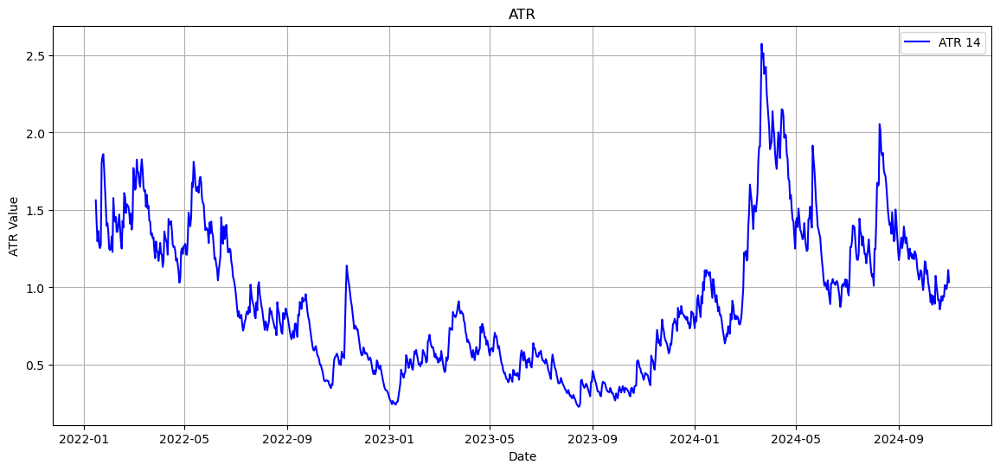

In [36]:
plt.figure(figsize=(14, 6))
plt.plot(data.index, data["ATR_14"], label="ATR 14", color="blue")
plt.title("ATR")
plt.xlabel("Date")
plt.ylabel("ATR Value")
plt.legend()
plt.grid(True)
plt.show()

In [37]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=data.index, y=data["ATR_14"], mode='lines', name='ATR 14', line=dict(color='blue')))

fig.update_layout(
    title="ATR",
    xaxis_title="Date",
    yaxis_title="ATR Value",
    template="plotly_white",
    hovermode="x unified"
)

fig.show()

+ Missing Values

In [11]:
data.shape

(1035, 12)

In [12]:
data.isna().sum()

Price         0
SMA_7         6
SMA_30       29
RSI_14       14
MACD         25
MACD_Hist    33
BB_upper     13
BB_middle    13
BB_lower     13
Stoch_K      15
Stoch_D      17
ATR_14       14
dtype: int64

+ Moving Window

Divide all dataset to some intervals (e.g. 1 natural month), and use these intervals as "batch" and input for the ML/DL models. Here we can move this interval forward for 15 days' stride each time and manually get some overlap data. This is the 1st layer of moving window. \
Inside each intervals, we use 14 days as moving window size and move forward for 1 day's stride each time. Also, we split these moving windows by 80%:20% as train and test set. This is the 2nd layer of moving window.

In [13]:
stride = 15
interval = 30
window_size = 14

First, we do the second layer of moving window: use historical 14 days' information as features.

In [14]:
data["Date"] = pd.to_datetime(data.index)
feature_columns = [col for col in data.columns if col != "Date"]

X_records = []
X_dates = []

y_records = []
y_dates = []

for i in range(len(data) - window_size):
    window_data = data.iloc[i:i + window_size]
    
    record = {}
    for day_offset in range(window_size):
        for col in feature_columns:
            record[f"{col}_t-{window_size - day_offset}"] = window_data.iloc[day_offset][col]
    
    X_records.append(record)
    X_dates.append(data.iloc[i + window_size]["Date"])
    
    y_records.append(data.iloc[i + window_size]["Price"])
    y_dates.append(data.iloc[i + window_size]["Date"])

X_df = pd.DataFrame(X_records)
X_df["Date"] = X_dates
X_df = X_df.set_index("Date")
X_df = X_df.dropna()

y_df = pd.DataFrame(y_records, columns=["Target_Price"])
y_df["Date"] = y_dates
y_df = y_df.set_index("Date")
y_df = y_df.loc[X_df.index]

X_df.shape, y_df.shape

((988, 168), (988, 1))

In [15]:
X_df.head()

,Price_t-14,SMA_7_t-14,SMA_30_t-14,RSI_14_t-14,MACD_t-14,MACD_Hist_t-14,BB_upper_t-14,BB_middle_t-14,BB_lower_t-14,Stoch_K_t-14,...,SMA_30_t-1,RSI_14_t-1,MACD_t-1,MACD_Hist_t-1,BB_upper_t-1,BB_middle_t-1,BB_lower_t-1,Stoch_K_t-1,Stoch_D_t-1,ATR_14_t-1
Date,,,,,,,,,,,,,,,,,,,,,
2022-02-17,41.760,41.675714,46.582200,38.318658,-3.662243,1.206769,45.735219,41.087857,36.440496,45.908080,...,45.035433,60.650648,0.280967,0.754655,53.522147,47.764929,42.007710,68.033510,58.812038,1.428662
2022-02-18,41.799,42.039857,46.028033,38.470734,-3.446668,1.137875,43.857460,40.693286,37.529111,53.643988,...,45.035233,57.921994,0.450915,0.739683,53.183402,48.372143,43.560883,79.811807,67.375031,1.385724
2022-02-19,47.541,42.995286,45.789433,55.763661,-2.780441,1.443281,45.933755,41.218929,36.504102,68.144739,...,44.901567,46.206945,0.225776,0.411635,52.169194,48.660357,45.151520,60.516596,69.453971,1.609336
2022-02-20,47.719,43.876000,45.615200,56.174859,-2.212583,1.608912,47.322734,41.920286,36.517837,87.823539,...,44.761167,43.483441,-0.054738,0.104897,52.518626,48.447500,44.376374,28.814656,56.381020,1.584658
2022-02-21,48.603,44.882000,45.577700,58.250448,-1.671947,1.719638,48.806617,42.540500,36.274383,100.000000,...,44.663800,43.141408,-0.286573,-0.101551,52.779369,48.210571,43.641773,0.000000,29.777084,1.480258


In [16]:
y_df.head()

,Target_Price
Date,
2022-02-17,50.261
2022-02-18,45.834
2022-02-19,44.561
2022-02-20,44.402
2022-02-21,42.139


Now we do the first layer of moving window: generate batches with "interval" days and move forward for "stride" days

In [30]:
X_train, X_test, y_train, y_test = [], [], [], []

startdate = X_df.index[0]

while startdate <= X_df.index[-1]:
    enddate = min(startdate + relativedelta(days=interval), X_df.index[-1])
    splitdate = startdate + 0.8 * (enddate-startdate)
    X_train.append(X_df[(X_df.index >= startdate) & (X_df.index < splitdate)].values)
    X_test.append(X_df[(X_df.index >= splitdate) & (X_df.index < enddate)].values)
    y_train.append(y_df[(y_df.index >= startdate) & (y_df.index < splitdate)].values)
    y_test.append(y_df[(y_df.index >= splitdate) & (y_df.index < enddate)].values)
    startdate += relativedelta(days=stride)

X_train = np.array(X_train, dtype=object)
X_test = np.array(X_test, dtype=object)
y_train = np.array(y_train, dtype=object)
y_test = np.array(y_test, dtype=object)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((66,), (66,), (66,), (66,))

In [44]:
np.save("X_train.npy", X_train)
np.save("y_train.npy", y_train)
np.save("X_test.npy", X_test)
np.save("y_test.npy", y_test)

+ Data Scaling

In [5]:
X_train = np.load("X_train.npy", allow_pickle=True)
y_train = np.load("y_train.npy", allow_pickle=True)
X_test = np.load("X_test.npy", allow_pickle=True)
y_test = np.load("y_test.npy", allow_pickle=True)

In [6]:
X_train_shape = [X.shape[0] for X in X_train]
X_test_shape = [X.shape[0] for X in X_test]
y_train_shape = [y.shape[0] for y in y_train]
y_test_shape = [y.shape[0] for y in y_test]

X_scalar = ManualMinMaxScalar()
X_train_scaled = X_scalar.fit_transform(X_train, X_train_shape)
X_test_scaled = X_scalar.transform(X_test, X_test_shape)

y_scalar = ManualMinMaxScalar()
y_train_scaled = y_scalar.fit_transform(y_train, y_train_shape)
y_test_scaled = y_scalar.transform(y_test, y_test_shape)

### 2. Machine Learning & Deep Learning Models

+ Random Forest

R² score (Random Forest): 0.994310


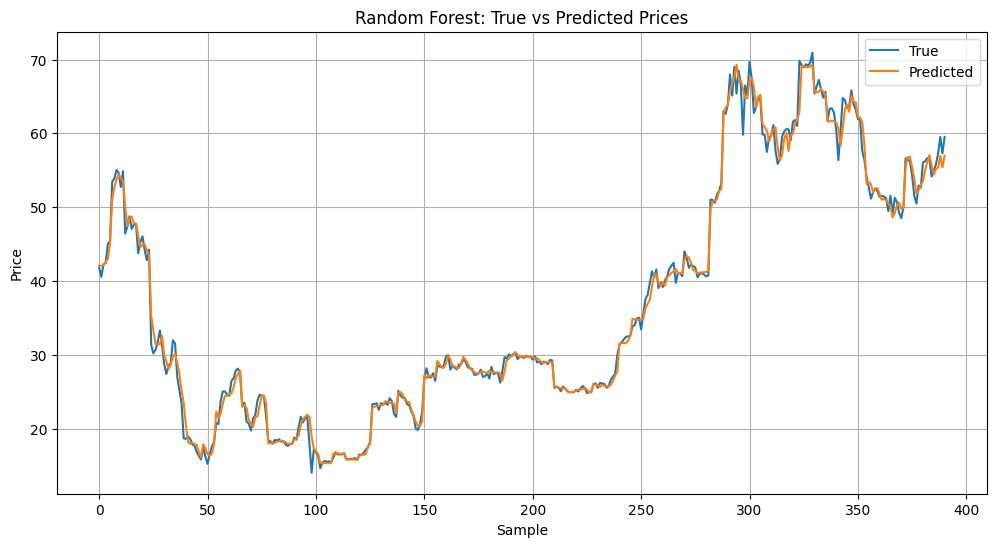

In [28]:
# Convert list of batches to single arrays
X_train_rf = np.concatenate(X_train)
y_train_rf = np.concatenate(y_train)
X_test_rf = np.concatenate(X_test)
y_test_rf = np.concatenate(y_test)

rf_model = RandomForestRegressor(
    n_estimators=50,          # Number of trees in the forest
    max_depth=8,              # Maximum depth of each tree
    min_samples_split=30,      # Minimum samples required to split a node
    min_samples_leaf=10,        # Minimum samples required at each leaf node
    max_features=0.5,       # Number of features to consider at each split
    bootstrap=True,            # Whether bootstrap samples are used
    oob_score=True,            # Whether to use out-of-bag scores
    criterion='squared_error', # Function to measure quality of split
    random_state=42,           # Random seed for reproducibility
    n_jobs=-1
)

rf_model.fit(X_train_rf, y_train_rf.ravel())

y_pred_rf = rf_model.predict(X_test_rf)
r2 = r2_score(y_test_rf, y_pred_rf)
print(f"R² score (Random Forest): {r2:.6f}")

plt.figure(figsize=(12, 6))
plt.plot(y_test_rf, label="True")
plt.plot(y_pred_rf, label="Predicted")
plt.title("Random Forest: True vs Predicted Prices")
plt.xlabel("Sample")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.show()

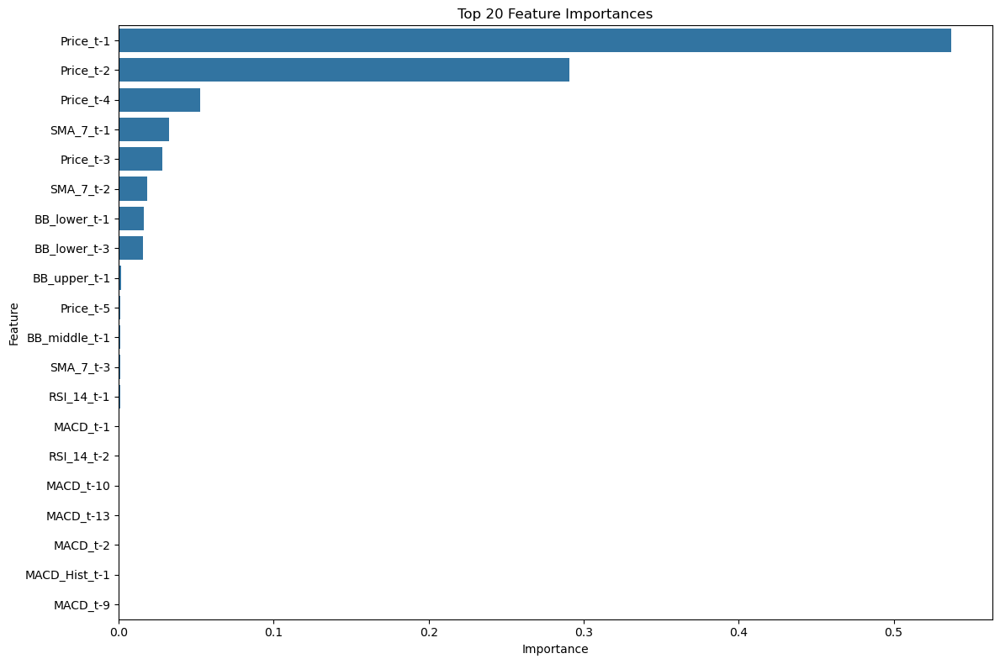

In [53]:
# Get feature importances
importances = rf_model.feature_importances_
feature_names = X_df.columns

# Create importance DataFrame
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot top features
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df.head(20))
plt.title('Top 20 Feature Importances')
plt.tight_layout()
plt.show()

In [29]:
dump(rf_model, 'RandomForest.joblib')

+ XGBoost

In [ ]:
# Concatenate sequences (still 3D at this point)
X_train_xgb = np.concatenate(X_train)
X_test_xgb = np.concatenate(X_test)
y_train_xgb = np.concatenate(y_train)
y_test_xgb = np.concatenate(y_test)

# Flatten the temporal features for XGBoost: (n_samples, seq_len, features) -> (n_samples, seq_len * features)
X_train_xgb_flat = X_train_xgb.reshape(X_train_xgb.shape[0], -1)
X_test_xgb_flat = X_test_xgb.reshape(X_test_xgb.shape[0], -1)

# Split a small validation set for early stopping
X_tr_xgb, X_val_xgb, y_tr_xgb, y_val_xgb = train_test_split(X_train_xgb_flat, y_train_xgb, test_size=0.2, random_state=42)

def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.3, log=True),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "gamma": trial.suggest_float("gamma", 0, 5),
        "reg_alpha": trial.suggest_float("reg_alpha", 0, 5),
        "reg_lambda": trial.suggest_float("reg_lambda", 0, 5),
        "random_state": 42,
        "early_stopping_rounds": 10,
        "verbosity": 0
    }

    xgb_model = XGBRegressor(**params)
    xgb_model.fit(X_tr_xgb, y_tr_xgb, eval_set=[(X_val_xgb, y_val_xgb)])
    preds_xgb = xgb_model.predict(X_val_xgb)
    return r2_score(y_val_xgb, preds_xgb)

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=30, show_progress_bar=True)

print("Best hyperparameters:", study.best_params)

best_params_xgb = study.best_params
best_xgb_model = XGBRegressor(**best_params_xgb)
best_xgb_model.fit(X_train_xgb_flat, y_train_xgb)

# Predict on test set
y_pred_xgb_test = best_xgb_model.predict(X_test_xgb_flat)

# Ensure y_pred_xgb_test and y_test_xgb are 2D arrays with shape (n_samples, 1)
y_pred_xgb_test = y_pred_xgb_test.reshape(-1, 1)
y_test_xgb = y_test_xgb.reshape(-1, 1)

# Inverse transform the predictions and ground truth
y_pred_xgb_inv = y_pred_xgb_test.flatten()
y_test_xgb_inv = y_test_xgb.flatten()

y_pred_xgb_inv = y_pred_xgb_inv.flatten()
y_test_xgb_inv = y_test_xgb_inv.flatten()

# Flatten the arrays before evaluating R²
y_pred_xgb_inv_flat = np.concatenate([y.flatten() for y in y_pred_xgb_inv])
y_test_xgb_inv_flat = np.concatenate([y.flatten() for y in y_test_xgb_inv])

# Now calculate the R² score
print("XGBoost Test R² score:", r2_score(y_test_xgb_inv_flat, y_pred_xgb_inv_flat))

In [37]:
print("XGBoost Test R² score:", r2_score(y_test_xgb_inv_flat, y_pred_xgb_inv_flat))
dump(best_xgb_model, 'XGBoost.joblib')

XGBoost Test R² score: 0.9989256275658868


['XGBoost.joblib']

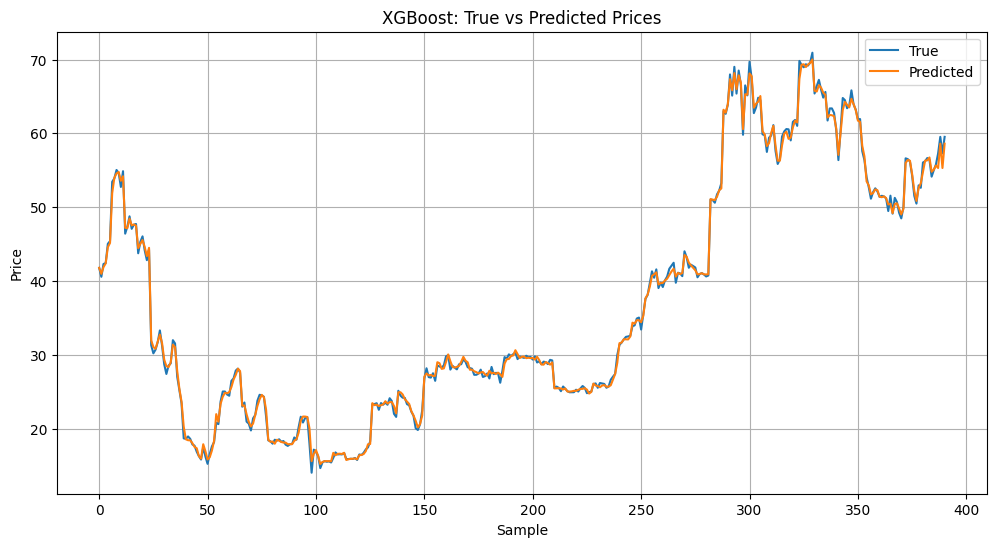

In [36]:
# Plotting True vs Predicted values
plt.figure(figsize=(12, 6))
plt.plot(y_test_xgb_inv_flat, label="True")
plt.plot(y_pred_xgb_inv_flat, label="Predicted")
plt.title("XGBoost: True vs Predicted Prices")
plt.xlabel("Sample")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.show()

+ LSTM

In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [8]:
features = 12
days = 14

X_train_gpu = [torch.tensor(batch.reshape(batch.shape[0], days, features), dtype=torch.float32, device=device) for batch in X_train_scaled]
y_train_gpu = [torch.tensor(batch, dtype=torch.float32, device=device) for batch in y_train_scaled]
X_test_gpu = [torch.tensor(batch.reshape(batch.shape[0], days, features), dtype=torch.float32, device=device) for batch in X_test_scaled]
y_test_gpu = [torch.tensor(batch, dtype=torch.float32, device=device) for batch in y_test_scaled]

In [9]:
class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=1, dropout=0.2):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers

        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0.0,
        )
        
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros_like(h0)

        out, _ = self.lstm(x, (h0, c0))

        out = out[:, -1, :]
        out = self.fc(out)

        return out

Epoch 5, Loss: 0.4452272653579712
Epoch 10, Loss: 0.4528765380382538
Epoch 15, Loss: 0.4497556686401367
Epoch 20, Loss: 0.4467202425003052
Epoch 25, Loss: 0.44525840878486633
Epoch 30, Loss: 0.4448253810405731
Epoch 35, Loss: 0.4449578821659088
Epoch 40, Loss: 0.44493749737739563
Epoch 45, Loss: 0.44480282068252563
Epoch 50, Loss: 0.4448413550853729
Epoch 55, Loss: 0.4466184079647064
Epoch 60, Loss: 0.444853812456131
Epoch 65, Loss: 0.44622302055358887
Epoch 70, Loss: 0.44488099217414856
Epoch 75, Loss: 0.44485509395599365
Epoch 80, Loss: 0.4449464678764343
Epoch 85, Loss: 0.44484445452690125
Epoch 90, Loss: 0.4449058473110199
Epoch 95, Loss: 0.44489768147468567
Epoch 100, Loss: 0.4450305998325348
R² score:  0.9702495491369393


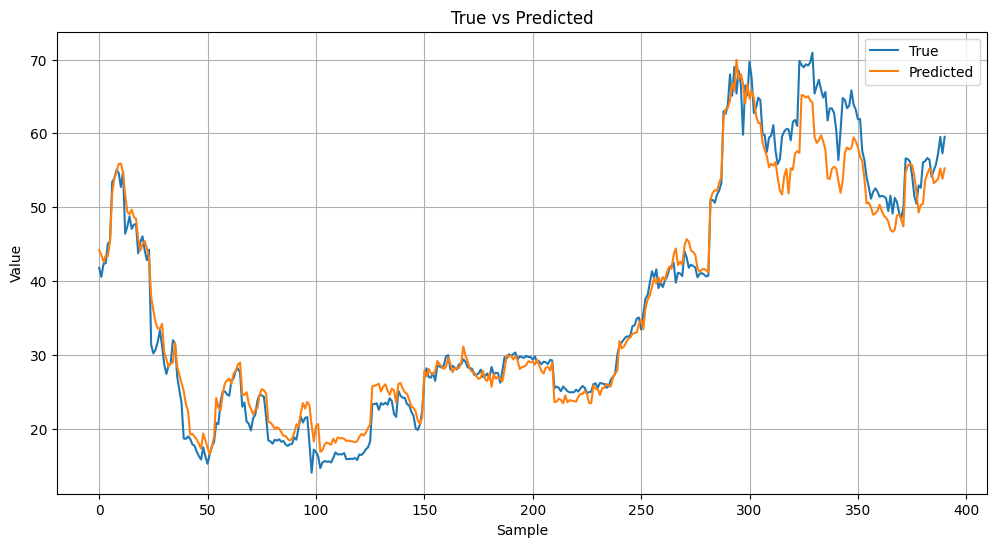

In [11]:
hidden_size = 512
num_layers = 1
dropout = 0.2

LSTMmodel = LSTM(input_size=features, hidden_size=hidden_size, num_layers=num_layers, dropout=dropout).to(device)
learning_rate = 1e-3
alpha = 1
criterion = nn.MSELoss()
optimizer = optim.Adam(LSTMmodel.parameters(), lr=learning_rate, weight_decay=learning_rate/10)

epochs = 100

LSTMmodel.train()
for epoch in range(epochs):
    for X_batch, y_batch in zip(X_train_gpu, y_train_gpu):
        preds = LSTMmodel(X_batch)
        y_batch_diff = torch.sign(y_batch[1:] - y_batch[:-1])
        preds_diff = torch.sign(preds[1:] - preds[:-1])
        ### Regression Loss
        loss_reg = criterion(preds.view(-1), y_batch.view(-1))
        ### Direction Loss
        direction_accuracy = (y_batch_diff == preds_diff).float().mean()
        loss_dir = 1 - direction_accuracy
        ### Total Loss
        loss = loss_reg + alpha * loss_dir
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    if epoch % 5 == 4:
        print(f"Epoch {epoch+1}, Loss: {loss.item()}")

LSTMmodel.eval()
with torch.no_grad():
    y_true, y_pred = [], []
    for X_batch, y_batch in zip(X_test_gpu, y_test_gpu):
        preds = LSTMmodel(X_batch)
        y_true.extend(y_scalar.inverse_transform(y_batch.cpu().numpy().reshape(1, -1).flatten(), reshape=False))
        y_pred.extend(y_scalar.inverse_transform(preds.view(-1).cpu().numpy(), reshape=False))
    print("R² score: ", r2_score(y_true, y_pred))

plt.figure(figsize=(12, 6))

plt.plot(y_true, label="True")
plt.plot(y_pred, label="Predicted")

plt.title("True vs Predicted")
plt.xlabel("Sample")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

In [12]:
model_config = {
    "input_size": features,
    "hidden_size": hidden_size,
    "num_layers": num_layers,
    "dropout": dropout
}

with open("best_lstm_model_config.json", "w") as f:
    json.dump(model_config, f)

torch.save(LSTMmodel.state_dict(), "LSTMmodel.pth")

+ GRU

In [10]:
class GRU(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, dropout):
        super(GRU, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers

        self.gru = nn.GRU(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0.0,
        )
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        out, _ = self.gru(x, h0)
        out = self.fc(out[:, -1, :])
        return out

Epoch 5, Loss: 0.44504469633102417
Epoch 10, Loss: 0.4448447823524475
Epoch 15, Loss: 0.4449525773525238
Epoch 20, Loss: 0.44491976499557495
Epoch 25, Loss: 0.44520485401153564
Epoch 30, Loss: 0.4456799328327179
Epoch 35, Loss: 0.44525599479675293
Epoch 40, Loss: 0.4447956383228302
Epoch 45, Loss: 0.5559397339820862
Epoch 50, Loss: 0.5559600591659546
Epoch 55, Loss: 0.5559280514717102
Epoch 60, Loss: 0.5562618970870972
Epoch 65, Loss: 0.44484907388687134
Epoch 70, Loss: 0.5559439659118652
Epoch 75, Loss: 0.5562102198600769
Epoch 80, Loss: 0.5564755797386169
Epoch 85, Loss: 0.4448157846927643
Epoch 90, Loss: 0.5562236905097961
Epoch 95, Loss: 0.5565682053565979
Epoch 100, Loss: 0.5559149384498596
R² score:  0.9095162784133554


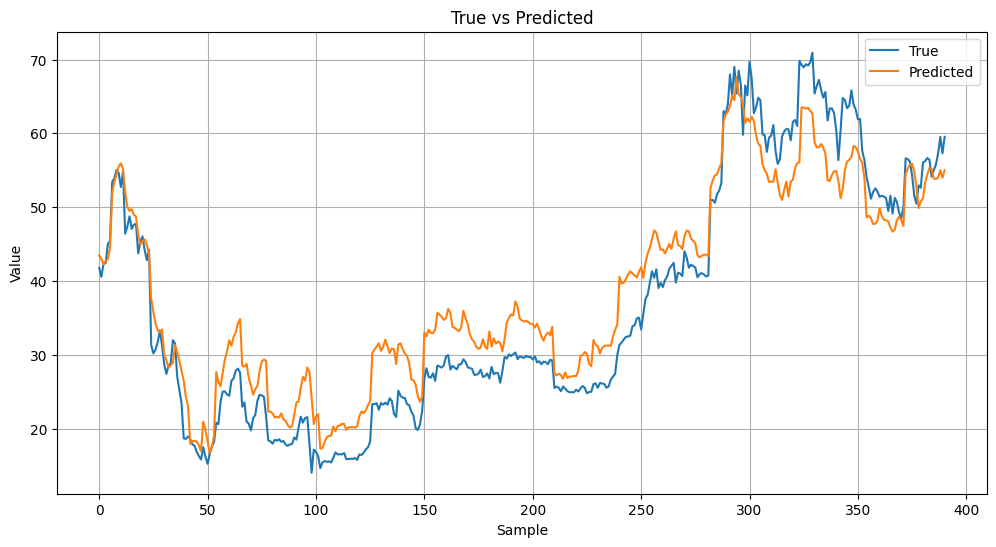

In [8]:
hidden_size = 512
num_layers = 1
dropout = 0.2

GRUmodel = GRU(input_size=features, hidden_size=hidden_size, num_layers=num_layers, dropout=dropout).to(device)
learning_rate = 1e-3
alpha = 1
criterion = nn.MSELoss()
optimizer = optim.Adam(GRUmodel.parameters(), lr=learning_rate, weight_decay=learning_rate/10)

epochs = 100

GRUmodel.train()
for epoch in range(epochs):
    for X_batch, y_batch in zip(X_train_gpu, y_train_gpu):
        preds = GRUmodel(X_batch)
        y_batch_diff = torch.sign(y_batch[1:] - y_batch[:-1])
        preds_diff = torch.sign(preds[1:] - preds[:-1])
        ### Regression Loss
        loss_reg = criterion(preds.view(-1), y_batch.view(-1))
        ### Direction Loss
        direction_accuracy = (y_batch_diff == preds_diff).float().mean()
        loss_dir = 1 - direction_accuracy
        ### Total Loss
        loss = loss_reg + alpha * loss_dir
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    if epoch % 5 == 4:
        print(f"Epoch {epoch+1}, Loss: {loss.item()}")

GRUmodel.eval()
with torch.no_grad():
    y_true, y_pred = [], []
    for X_batch, y_batch in zip(X_test_gpu, y_test_gpu):
        preds = GRUmodel(X_batch)
        y_true.extend(y_scalar.inverse_transform(y_batch.cpu().numpy().reshape(1, -1).flatten(), reshape=False))
        y_pred.extend(y_scalar.inverse_transform(preds.view(-1).cpu().numpy(), reshape=False))
    print("R² score: ", r2_score(y_true, y_pred))

plt.figure(figsize=(12, 6))

plt.plot(y_true, label="True")
plt.plot(y_pred, label="Predicted")

plt.title("True vs Predicted")
plt.xlabel("Sample")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
model_config = {
    "input_size": features,
    "hidden_size": hidden_size,
    "num_layers": num_layers,
    "dropout": dropout
}

with open("best_gru_model_config.json", "w") as f:
    json.dump(model_config, f)

torch.save(GRUmodel.state_dict(), "GRUmodel.pth")

+ Ensemble Model

In [11]:
def stock_price_prediction(X):
    '''
    This function is designed to make the stock price prediction, which uses 14 days historical data as input and return the future price. \n
    Also, this function uses ensemble method to generate future price. Here we choose to use average.
    '''
    results = {}

    ### Random Forest
    RFmodel = load('RandomForest.joblib')
    RFresult = RFmodel.predict(X.reshape(1, -1))
    results["Random Forest"] = float(RFresult)

    ### XGBoost
    XGBmodel = load('XGBoost.joblib')
    XGBresult = XGBmodel.predict(X.reshape(1, -1))
    results["XGBoost"] = float(XGBresult)

    ### LSTM
    with open("best_lstm_model_config.json", "r") as f:
        LSTMparams = json.load(f)
    LSTMmodel = LSTM(**LSTMparams)
    LSTMmodel.load_state_dict(torch.load('LSTMmodel.pth', weights_only=True))
    LSTMmodel.eval()
    X_scaled = X_scalar.transform(X, reshape=False)
    LSTMresult = LSTMmodel(torch.tensor(X_scaled.reshape(1, 14, 12), dtype=torch.float32))
    results["LSTM"] = float(y_scalar.inverse_transform(float(LSTMresult), reshape=False))

    ### GRU
    with open("best_gru_model_config.json", "r") as f:
        GRUparams = json.load(f)
    GRUmodel = GRU(**GRUparams)
    GRUmodel.load_state_dict(torch.load('GRUmodel.pth', weights_only=True))
    GRUmodel.eval()
    GRUresult = GRUmodel(torch.tensor(X_scaled.reshape(1, 14, 12), dtype=torch.float32))
    results["GRU"] = float(y_scalar.inverse_transform(float(GRUresult), reshape=False))

    return float(np.mean(list(results.values())))

### 3. Trading Algorithm

+ Distribution of Return

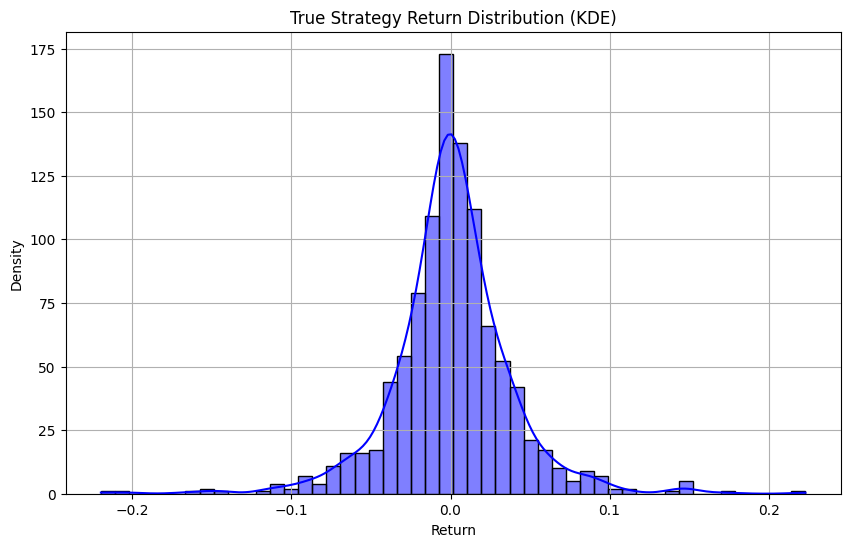

In [12]:
returns = data["Price"].pct_change()[1:]

plt.figure(figsize=(10,6))
sns.histplot(returns, bins=50, kde=True, color="blue")
plt.title("True Strategy Return Distribution (KDE)")
plt.xlabel("Return")
plt.ylabel("Density")
plt.grid(True)
plt.show()

+ Normal Distribution Test

In [67]:
mu_t, sigma_t = norm.fit(returns)
print(f"Fitted parameters of normal distribution: mean={mu_t:.2f}, standard deviation={sigma_t:.4f}")

Fitted parameters of normal distribution: mean=0.00, standard deviation=0.0377


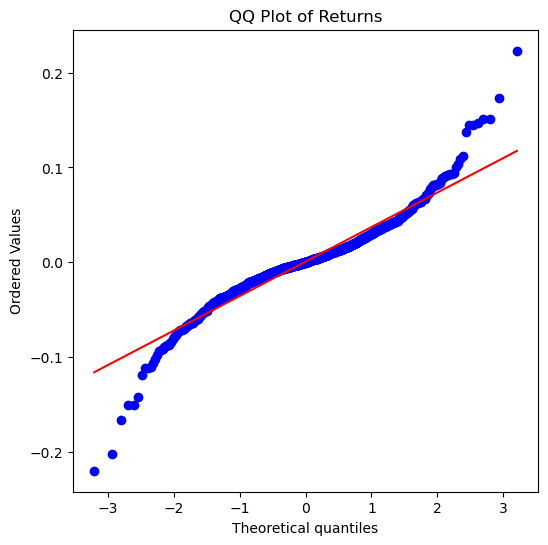

In [69]:
plt.figure(figsize=(6, 6))
probplot(returns, dist="norm", plot=plt)
plt.title("QQ Plot of Returns")
plt.show()

In [71]:
shapiro_stat, shapiro_p = shapiro(returns)
jb_stat, jb_p = jarque_bera(returns)

print(f"Shapiro-Wilk Test: statistic={shapiro_stat:.4f}, p-value={shapiro_p:.4f}")
print(f"Jarque-Bera Test: statistic={jb_stat:.4f}, p-value={jb_p:.4f}")

Shapiro-Wilk Test: statistic=0.9298, p-value=0.0000
Jarque-Bera Test: statistic=1204.5287, p-value=0.0000


+ t-Distribution Test

In [13]:
df_t, loc_t, scale_t = t.fit(returns)
print(f"Fitted parameters of t-distribution: df={df_t:.2f}, loc={loc_t:.4f}, scale={scale_t:.4f}")

Fitted parameters of t-distribution: df=2.70, loc=0.0006, scale=0.0227


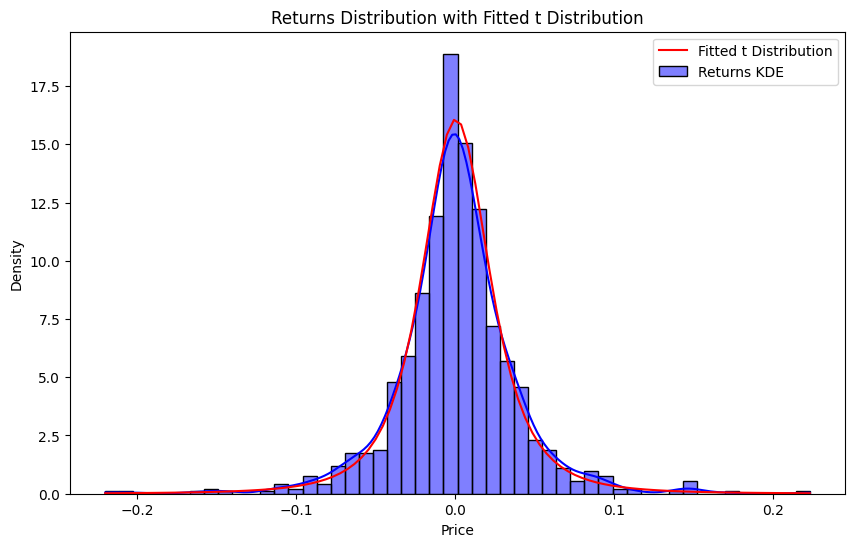

In [10]:
plt.figure(figsize=(10, 6))
sns.histplot(returns, bins=50, kde=True, stat="density", color='blue', label="Returns KDE")

x = np.linspace(returns.min(), returns.max(), 100)
pdf_t = t.pdf(x, df_t, loc_t, scale_t)
plt.plot(x, pdf_t, 'r-', label='Fitted t Distribution')

plt.title("Returns Distribution with Fitted t Distribution")
plt.legend()
plt.show()

In [11]:
ks_stat, ks_p = kstest(returns, 't', args=(df_t, loc_t, scale_t))
print(f"KS Test against t-distribution: statistic={ks_stat:.4f}, p-value={ks_p:.4f}")

KS Test against t-distribution: statistic=0.0226, p-value=0.6571


+ Position Signal Algorithm based on t-Distribution Quantile

In [14]:
def generate_position_predict(r, low_threshold=0.667, high_threshold=0.833, leverage=False):
    low_q = t.ppf(1-low_threshold, df_t, loc_t, scale_t)
    low_q_strong = t.ppf(1-high_threshold, df_t, loc_t, scale_t)
    high_q = t.ppf(low_threshold, df_t, loc_t, scale_t)
    high_q_strong = t.ppf(high_threshold, df_t, loc_t, scale_t)

    if r < low_q_strong:
        return -(1 + leverage)
    elif r < low_q:
        return -1
    elif r > high_q_strong:
        return 1 + leverage
    elif r > high_q:
        return 1
    else:
        return 0

### 4. Backtesting

In [1]:
import numpy as np
from matplotlib import pyplot as plt
import plotly.graph_objects as go
from scipy.stats import t
from joblib import load
import torch
from NeuralNetworks import LSTM, GRU
import json
from tqdm import tqdm
import DataPreprocessing as dp
from ManualScalar import ManualMinMaxScalar
from sklearn.metrics import r2_score, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

+ Data Preprocessing

In [2]:
filename = "Pro3_Stage1_SP25.xlsx"
data, prices = dp.movingWindow(dp.getTechnicalIndicators(filename))
data.shape, prices.shape

((988, 168), (988, 1))

In [3]:
def get_scalar():
    X_train, _, y_train, _ = dp.traintestSplit(data, prices)
    X_train_shape = [X.shape[0] for X in X_train]
    y_train_shape = [y.shape[0] for y in y_train]

    X_scalar = ManualMinMaxScalar()
    _ = X_scalar.fit_transform(X_train, X_train_shape)

    y_scalar = ManualMinMaxScalar()
    _ = y_scalar.fit_transform(y_train, y_train_shape)

    return X_scalar, y_scalar

X_scalar, y_scalar = get_scalar()

+ Return Prediction

In [4]:
returns = prices.pct_change()[1:]
df_t, loc_t, scale_t = t.fit(returns)

def generate_position_predict(r, low_threshold=0.667, high_threshold=0.833, leverage=False):
    low_q = t.ppf(1-low_threshold, df_t, loc_t, scale_t)
    low_q_strong = t.ppf(1-high_threshold, df_t, loc_t, scale_t)
    high_q = t.ppf(low_threshold, df_t, loc_t, scale_t)
    high_q_strong = t.ppf(high_threshold, df_t, loc_t, scale_t)

    if r < low_q_strong:
        return -(1 + leverage)
    elif r < low_q:
        return -1
    elif r > high_q_strong:
        return 1 + leverage
    elif r > high_q:
        return 1
    else:
        return 0

+ Stock Price Prediction Function

In [5]:
def stock_price_prediction(X):
    '''
    This function is designed to make the stock price prediction, which uses 14 days historical data as input and return the future price. \n
    Also, this function uses ensemble method to generate future price. Here we choose to use average.
    '''
    results = {}

    ### Random Forest
    RFmodel = load('./models/RandomForest.joblib')
    RFresult = RFmodel.predict(X.reshape(1, -1))
    results["Random Forest"] = float(RFresult)

    ### XGBoost
    XGBmodel = load('./models/XGBoost.joblib')
    XGBresult = XGBmodel.predict(X.reshape(1, -1))
    results["XGBoost"] = float(XGBresult)

    ### LSTM
    with open("./models/best_lstm_model_config.json", "r") as f:
        LSTMparams = json.load(f)
    LSTMmodel = LSTM(**LSTMparams)
    LSTMmodel.load_state_dict(torch.load('./models/LSTMmodel.pth', weights_only=True))
    LSTMmodel.eval()
    X_scaled = X_scalar.transform(X, reshape=False)
    LSTMresult = LSTMmodel(torch.tensor(X_scaled.reshape(1, 14, 12), dtype=torch.float32))
    results["LSTM"] = float(y_scalar.inverse_transform(float(LSTMresult), reshape=False))

    ### GRU
    with open("./models/best_gru_model_config.json", "r") as f:
        GRUparams = json.load(f)
    GRUmodel = GRU(**GRUparams)
    GRUmodel.load_state_dict(torch.load('./models/GRUmodel.pth', weights_only=True))
    GRUmodel.eval()
    GRUresult = GRUmodel(torch.tensor(X_scaled.reshape(1, 14, 12), dtype=torch.float32))
    results["GRU"] = float(y_scalar.inverse_transform(float(GRUresult), reshape=False))

    return float(np.mean(list(results.values())))

In [6]:
stock_price_prediction(np.array(data.iloc[0])), prices["Price"].iloc[1]

(50.294817935515475, 45.834)

+ Trading Strategy Implementation

In [7]:
def trade(signal, price) -> None:
    global capital, crypto, feerate, averageprice
    if signal > 0:
        capital -= signal * price * (1 + feerate)
        averageprice = (crypto * averageprice + signal * price) / (crypto + signal)
        crypto += signal
    elif signal < 0:
        capital -= signal * price * (1 - feerate)
        averageprice = (crypto * averageprice - signal * price) / (crypto - signal)
        crypto += signal
    else:
        return

Trading with 1 unit of crypto coin (no leverage)

In [8]:
actionlist = [] ### Memorize all reactions, 1 as buy, 0 as hold, -1 as sell
feerate = 0.01
capital = 10000
crypto = 100
averageprice = prices["Price"].iloc[0]
portfoliovalues = [] ### Capital + Crypto Values
netprofits = [0]
tradingcosts = [0]
capitals = []
cryptos = []
predprices = []
leverage = False ### Trade 1 unit or 2 unit of crypto each time

for i in tqdm(range(len(data.index))):
    date = data.index[i]
    predprice = stock_price_prediction(np.array(data.loc[date]))
    predprices.append(predprice)
    curprice = prices.loc[date, "Price"]
    returnrate = (predprice - curprice) / curprice - feerate
    signal = generate_position_predict(returnrate, leverage=leverage)
    ### if capital is gonna lower than 0
    cost = signal * curprice * (1 + feerate)
    cryptoaftertrade = crypto + signal
    if (signal > 0) and (capital - cost < 0): 
        signal = 0
    ### if crypto number is gonna lower than 0:
    if (signal < 0) and (cryptoaftertrade < 0): 
        signal = 0

    ### Avoid 5 continuous trading signal
    if len(actionlist) < 4:
        trade(signal, curprice)
        actionlist.append(np.sign(signal))
        portfoliovalues.append(capital + crypto * curprice)
        netprofits.append(netprofits[-1] - signal * (curprice - averageprice))
        tradingcosts.append(tradingcosts[-1] + abs(signal) * curprice * feerate)
        capitals.append(capital)
        cryptos.append(crypto)
        continue
    else:
        pastactions = actionlist[-4:]
        if len(set(pastactions)) != 1:
            trade(signal, curprice)
            actionlist.append(np.sign(signal))
            portfoliovalues.append(capital + crypto * curprice)
            netprofits.append(netprofits[-1] - signal * (curprice - averageprice))
            tradingcosts.append(tradingcosts[-1] + abs(signal) * curprice * feerate)
            capitals.append(capital)
            cryptos.append(crypto)
            continue
        elif pastactions[0] == 0 and signal == 0:
            ### if capital is gonna lower than 0
            if capital - cost < 0: 
                signal = -1
            ### if crypto number is gonna lower than 0:
            elif cryptoaftertrade < 0: 
                signal = 1
            else:
                signal = 1 if returnrate > 0 else -1
            trade(signal, curprice)
            actionlist.append(np.sign(signal))
            portfoliovalues.append(capital + crypto * curprice)
            netprofits.append(netprofits[-1])
            tradingcosts.append(tradingcosts[-1])
            capitals.append(capital)
            cryptos.append(crypto)
            continue
        elif (pastactions[0] == 1 and signal > 0) or (pastactions[0] == -1 and signal < 0):
            signal = 0
            actionlist.append(np.sign(signal))
            portfoliovalues.append(capital + crypto * curprice)
            netprofits.append(netprofits[-1] - signal * (curprice - averageprice))
            tradingcosts.append(tradingcosts[-1] + abs(signal) * curprice * feerate)
            capitals.append(capital)
            cryptos.append(crypto)
            continue
        else:
            trade(signal, curprice)
            actionlist.append(np.sign(signal))
            portfoliovalues.append(capital + crypto * curprice)
            netprofits.append(netprofits[-1] - signal * (curprice - averageprice))
            tradingcosts.append(tradingcosts[-1] + abs(signal) * curprice * feerate)
            capitals.append(capital)
            cryptos.append(crypto)
            continue

r2score = r2_score(prices["Price"], predprices)
mseloss = mean_squared_error(prices["Price"], predprices)

print(f"R² score of Prediction on Stock Price: {r2score:.4f}")
print(f"MSELoss of Prediction on Stock Price: {mseloss:.4f}")
print(f"Final Portfolio Value: ${portfoliovalues[-1]:.2f}")
print(f"Final Net Profit: ${netprofits[-1]:.2f}")
print(f"Total Trading Costs: ${tradingcosts[-1]:.2f}")

fig = go.Figure()
fig.add_trace(go.Scatter(x=data.index, y=portfoliovalues, mode='lines', name='Portfolio Value', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=data.index, y=netprofits[1:], mode='lines', name='Net Profit', line=dict(color='red')))
fig.add_trace(go.Scatter(x=data.index, y=tradingcosts[1:], mode='lines', name='Trading Cost', line=dict(color='green')))
fig.add_trace(go.Scatter(x=data.index, y=capitals, mode='lines', name='Capital Value', line=dict(color='yellow')))
fig.add_trace(go.Scatter(x=data.index, y=cryptos, mode='lines', name='Crypto Number', line=dict(color='purple')))
fig.update_layout(
    title="Portfolio Values, Net Profits and Trading Costs (Without Leverage)",
    xaxis_title="Date",
    yaxis_title="Price",
    template="plotly_white",
    hovermode="x unified"
)
fig.show()

100%|██████████| 988/988 [01:57<00:00,  8.42it/s]


R² score of Prediction on Stock Price: 0.9934
MSELoss of Prediction on Stock Price: 1.7472
Final Portfolio Value: $25110.23
Final Net Profit: $4644.51
Total Trading Costs: $247.06


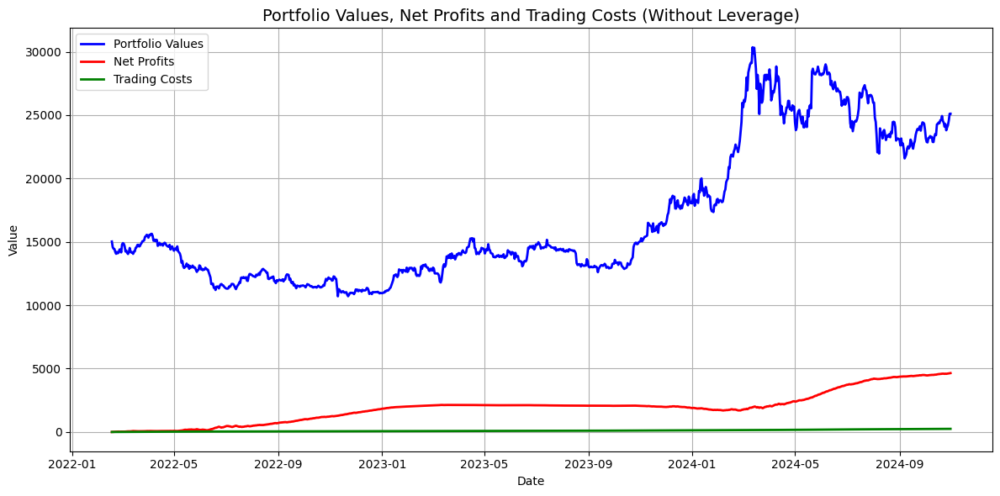

In [9]:
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(data.index, portfoliovalues, label='Portfolio Values', color='blue', linewidth=2)
ax.plot(data.index, netprofits[1:], label='Net Profits', color='red', linewidth=2)
ax.plot(data.index, tradingcosts[1:], label='Trading Costs', color='green', linewidth=2)

ax.set_title("Portfolio Values, Net Profits and Trading Costs (Without Leverage)", fontsize=14)
ax.set_xlabel("Date")
ax.set_ylabel("Value")
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

Trading with 1 or 2 units of crypto (with leverage)

In [10]:
actionlist = [] ### Memorize all reactions, 1 as buy, 0 as hold, -1 as sell
feerate = 0.01
capital = 10000
crypto = 100
averageprice = prices["Price"].iloc[0]
portfoliovalues = [] ### Capital + Crypto Values
netprofits = [0]
tradingcosts = [0]
capitals = []
cryptos = []
predprices = []
leverage = True ### Trade 1 unit or 2 unit of crypto each time

for i in tqdm(range(len(data.index))):
    date = data.index[i]
    predprice = stock_price_prediction(np.array(data.loc[date]))
    predprices.append(predprice)
    curprice = prices.loc[date, "Price"]
    returnrate = (predprice - curprice) / curprice - feerate
    signal = generate_position_predict(returnrate, leverage=leverage)
    ### if capital is gonna lower than 0
    cost = signal * curprice * (1 + feerate)
    cryptoaftertrade = crypto + signal
    if (signal > 0) and (capital - cost < 0): 
        signal = 0
    ### if crypto number is gonna lower than 0:
    if (signal < 0) and (cryptoaftertrade < 0): 
        signal = 0

    ### Avoid 5 continuous trading signal
    if len(actionlist) < 4:
        trade(signal, curprice)
        actionlist.append(np.sign(signal))
        portfoliovalues.append(capital + crypto * curprice)
        netprofits.append(netprofits[-1] - signal * (curprice - averageprice))
        tradingcosts.append(tradingcosts[-1] + abs(signal) * curprice * feerate)
        capitals.append(capital)
        cryptos.append(crypto)
        continue
    else:
        pastactions = actionlist[-4:]
        if len(set(pastactions)) != 1:
            trade(signal, curprice)
            actionlist.append(np.sign(signal))
            portfoliovalues.append(capital + crypto * curprice)
            netprofits.append(netprofits[-1] - signal * (curprice - averageprice))
            tradingcosts.append(tradingcosts[-1] + abs(signal) * curprice * feerate)
            capitals.append(capital)
            cryptos.append(crypto)
            continue
        elif pastactions[0] == 0 and signal == 0:
            ### if capital is gonna lower than 0
            if capital - cost < 0: 
                signal = -1
            ### if crypto number is gonna lower than 0:
            elif cryptoaftertrade < 0: 
                signal = 1
            else:
                signal = 1 if returnrate > 0 else -1
            trade(signal, curprice)
            actionlist.append(np.sign(signal))
            portfoliovalues.append(capital + crypto * curprice)
            netprofits.append(netprofits[-1])
            tradingcosts.append(tradingcosts[-1])
            capitals.append(capital)
            cryptos.append(crypto)
            continue
        elif (pastactions[0] == 1 and signal > 0) or (pastactions[0] == -1 and signal < 0):
            signal = 0
            actionlist.append(np.sign(signal))
            portfoliovalues.append(capital + crypto * curprice)
            netprofits.append(netprofits[-1] - signal * (curprice - averageprice))
            tradingcosts.append(tradingcosts[-1] + abs(signal) * curprice * feerate)
            capitals.append(capital)
            cryptos.append(crypto)
            continue
        else:
            trade(signal, curprice)
            actionlist.append(np.sign(signal))
            portfoliovalues.append(capital + crypto * curprice)
            netprofits.append(netprofits[-1] - signal * (curprice - averageprice))
            tradingcosts.append(tradingcosts[-1] + abs(signal) * curprice * feerate)
            capitals.append(capital)
            cryptos.append(crypto)
            continue

r2score = r2_score(prices["Price"], predprices)
mseloss = mean_squared_error(prices["Price"], predprices)

print(f"R² score of Prediction on Stock Price: {r2score:.4f}")
print(f"MSELoss of Prediction on Stock Price: {mseloss:.4f}")
print(f"Final Portfolio Value: ${portfoliovalues[-1]:.2f}")
print(f"Final Net Profit: ${netprofits[-1]:.2f}")
print(f"Total Trading Costs: ${tradingcosts[-1]:.2f}")

fig = go.Figure()
fig.add_trace(go.Scatter(x=data.index, y=portfoliovalues, mode='lines', name='Portfolio Value', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=data.index, y=netprofits[1:], mode='lines', name='Net Profit', line=dict(color='red')))
fig.add_trace(go.Scatter(x=data.index, y=tradingcosts[1:], mode='lines', name='Trading Cost', line=dict(color='green')))
fig.add_trace(go.Scatter(x=data.index, y=capitals, mode='lines', name='Capital Value', line=dict(color='yellow')))
fig.add_trace(go.Scatter(x=data.index, y=cryptos, mode='lines', name='Crypto Number', line=dict(color='purple')))
fig.update_layout(
    title="Portfolio Values, Net Profits and Trading Costs (With Leverage)",
    xaxis_title="Date",
    yaxis_title="Price",
    template="plotly_white",
    hovermode="x unified"
)
fig.show()

100%|██████████| 988/988 [01:58<00:00,  8.36it/s]


R² score of Prediction on Stock Price: 0.9934
MSELoss of Prediction on Stock Price: 1.7472
Final Portfolio Value: $31401.68
Final Net Profit: $7469.16
Total Trading Costs: $367.61


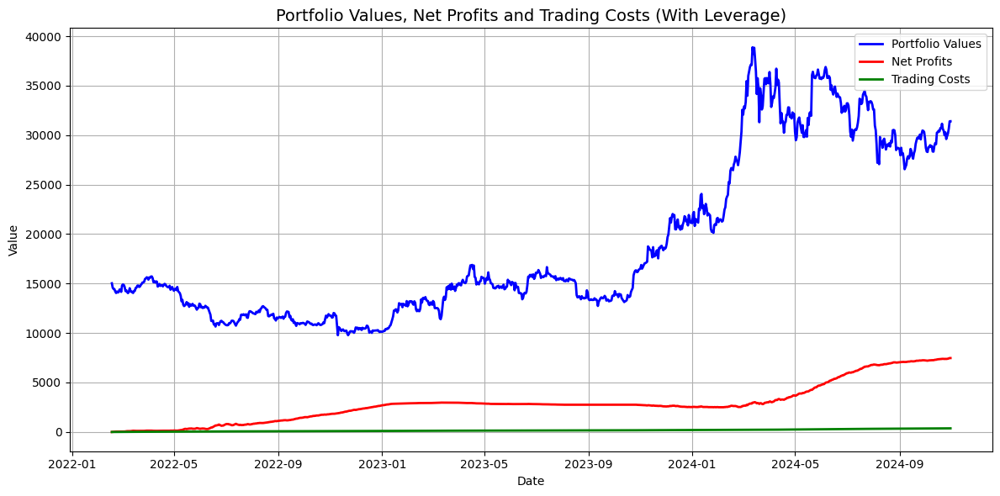

In [11]:
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(data.index, portfoliovalues, label='Portfolio Values', color='blue', linewidth=2)
ax.plot(data.index, netprofits[1:], label='Net Profits', color='red', linewidth=2)
ax.plot(data.index, tradingcosts[1:], label='Trading Costs', color='green', linewidth=2)

ax.set_title("Portfolio Values, Net Profits and Trading Costs (With Leverage)", fontsize=14)
ax.set_xlabel("Date")
ax.set_ylabel("Value")
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

+ Stage 2: Out-of-time Data

In [12]:
filename = "Pro3_Stage2_SP25.xlsx"
data, prices = dp.movingWindow(dp.getTechnicalIndicators(filename))
data.shape, prices.shape

((1162, 168), (1162, 1))

+ No Leverage

In [13]:
actionlist = [] ### Memorize all reactions, 1 as buy, 0 as hold, -1 as sell
feerate = 0.01
capital = 10000
crypto = 100
averageprice = prices["Price"].iloc[0]
portfoliovalues = [] ### Capital + Crypto Values
netprofits = [0]
tradingcosts = [0]
capitals = []
cryptos = []
predprices = []
leverage = False ### Trade 1 unit or 2 unit of crypto each time

for i in tqdm(range(len(data.index))):
    date = data.index[i]
    predprice = stock_price_prediction(np.array(data.loc[date]))
    predprices.append(predprice)
    curprice = prices.loc[date, "Price"]
    returnrate = (predprice - curprice) / curprice - feerate
    signal = generate_position_predict(returnrate, leverage=leverage)
    ### if capital is gonna lower than 0
    cost = signal * curprice * (1 + feerate)
    cryptoaftertrade = crypto + signal
    if (signal > 0) and (capital - cost < 0): 
        signal = 0
    ### if crypto number is gonna lower than 0:
    if (signal < 0) and (cryptoaftertrade < 0): 
        signal = 0

    ### Avoid 5 continuous trading signal
    if len(actionlist) < 4:
        trade(signal, curprice)
        actionlist.append(np.sign(signal))
        portfoliovalues.append(capital + crypto * curprice)
        netprofits.append(netprofits[-1] - signal * (curprice - averageprice))
        tradingcosts.append(tradingcosts[-1] + abs(signal) * curprice * feerate)
        capitals.append(capital)
        cryptos.append(crypto)
        continue
    else:
        pastactions = actionlist[-4:]
        if len(set(pastactions)) != 1:
            trade(signal, curprice)
            actionlist.append(np.sign(signal))
            portfoliovalues.append(capital + crypto * curprice)
            netprofits.append(netprofits[-1] - signal * (curprice - averageprice))
            tradingcosts.append(tradingcosts[-1] + abs(signal) * curprice * feerate)
            capitals.append(capital)
            cryptos.append(crypto)
            continue
        elif pastactions[0] == 0 and signal == 0:
            ### if capital is gonna lower than 0
            if capital - cost < 0: 
                signal = -1
            ### if crypto number is gonna lower than 0:
            elif cryptoaftertrade < 0: 
                signal = 1
            else:
                signal = 1 if returnrate > 0 else -1
            trade(signal, curprice)
            actionlist.append(np.sign(signal))
            portfoliovalues.append(capital + crypto * curprice)
            netprofits.append(netprofits[-1])
            tradingcosts.append(tradingcosts[-1])
            capitals.append(capital)
            cryptos.append(crypto)
            continue
        elif (pastactions[0] == 1 and signal > 0) or (pastactions[0] == -1 and signal < 0):
            signal = 0
            actionlist.append(np.sign(signal))
            portfoliovalues.append(capital + crypto * curprice)
            netprofits.append(netprofits[-1] - signal * (curprice - averageprice))
            tradingcosts.append(tradingcosts[-1] + abs(signal) * curprice * feerate)
            capitals.append(capital)
            cryptos.append(crypto)
            continue
        else:
            trade(signal, curprice)
            actionlist.append(np.sign(signal))
            portfoliovalues.append(capital + crypto * curprice)
            netprofits.append(netprofits[-1] - signal * (curprice - averageprice))
            tradingcosts.append(tradingcosts[-1] + abs(signal) * curprice * feerate)
            capitals.append(capital)
            cryptos.append(crypto)
            continue

r2score = r2_score(prices["Price"][988:], predprices[988:])
mseloss = mean_squared_error(prices["Price"][988:], predprices[988:])

print(f"R² score of Prediction on Stock Price (out of time): {r2score:.4f}")
print(f"MSELoss of Prediction on Stock Price (out of time): {mseloss:.4f}")
print(f"Final Portfolio Value: ${portfoliovalues[-1]:.2f}")
print(f"Final Net Profit: ${netprofits[-1]:.2f}")
print(f"Total Trading Costs: ${tradingcosts[-1]:.2f}")

fig = go.Figure()
fig.add_trace(go.Scatter(x=data.index, y=portfoliovalues, mode='lines', name='Portfolio Value', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=data.index, y=netprofits[1:], mode='lines', name='Net Profit', line=dict(color='red')))
fig.add_trace(go.Scatter(x=data.index, y=tradingcosts[1:], mode='lines', name='Trading Cost', line=dict(color='green')))
fig.add_trace(go.Scatter(x=data.index, y=capitals, mode='lines', name='Capital Value', line=dict(color='yellow')))
fig.add_trace(go.Scatter(x=data.index, y=cryptos, mode='lines', name='Crypto Number', line=dict(color='purple')))
fig.update_layout(
    title="Portfolio Values, Net Profits and Trading Costs (Without Leverage)",
    xaxis_title="Date",
    yaxis_title="Price",
    template="plotly_white",
    hovermode="x unified"
)
fig.show()

100%|██████████| 1162/1162 [02:20<00:00,  8.28it/s]


R² score of Prediction on Stock Price (out of time): 0.6075
MSELoss of Prediction on Stock Price (out of time): 50.4587
Final Portfolio Value: $26777.07
Final Net Profit: $7258.32
Total Trading Costs: $345.73


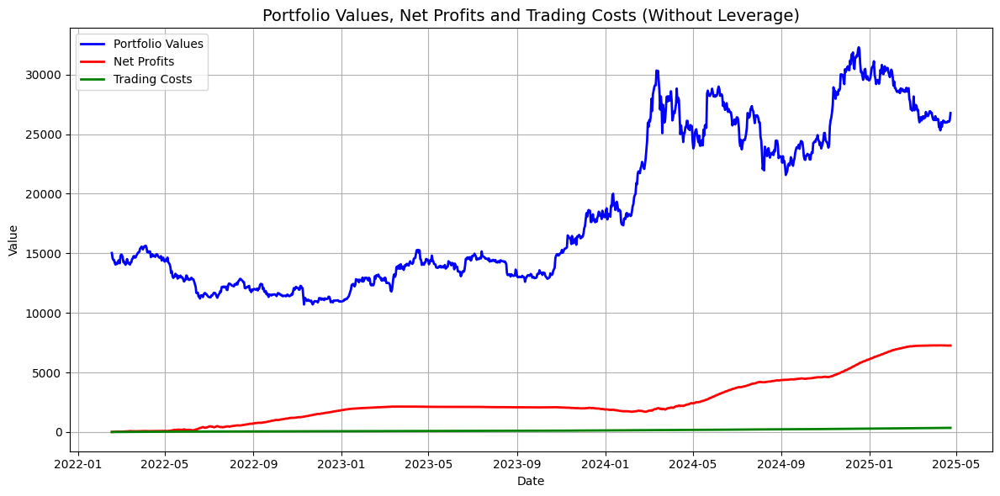

In [14]:
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(data.index, portfoliovalues, label='Portfolio Values', color='blue', linewidth=2)
ax.plot(data.index, netprofits[1:], label='Net Profits', color='red', linewidth=2)
ax.plot(data.index, tradingcosts[1:], label='Trading Costs', color='green', linewidth=2)

ax.set_title("Portfolio Values, Net Profits and Trading Costs (Without Leverage)", fontsize=14)
ax.set_xlabel("Date")
ax.set_ylabel("Value")
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

+ With Levearge

In [15]:
actionlist = [] ### Memorize all reactions, 1 as buy, 0 as hold, -1 as sell
feerate = 0.01
capital = 10000
crypto = 100
averageprice = prices["Price"].iloc[0]
portfoliovalues = [] ### Capital + Crypto Values
netprofits = [0]
tradingcosts = [0]
capitals = []
cryptos = []
predprices = []
leverage = True ### Trade 1 unit or 2 unit of crypto each time

for i in tqdm(range(len(data.index))):
    date = data.index[i]
    predprice = stock_price_prediction(np.array(data.loc[date]))
    predprices.append(predprice)
    curprice = prices.loc[date, "Price"]
    returnrate = (predprice - curprice) / curprice - feerate
    signal = generate_position_predict(returnrate, leverage=leverage)
    ### if capital is gonna lower than 0
    cost = signal * curprice * (1 + feerate)
    cryptoaftertrade = crypto + signal
    if (signal > 0) and (capital - cost < 0): 
        signal = 0
    ### if crypto number is gonna lower than 0:
    if (signal < 0) and (cryptoaftertrade < 0): 
        signal = 0

    ### Avoid 5 continuous trading signal
    if len(actionlist) < 4:
        trade(signal, curprice)
        actionlist.append(np.sign(signal))
        portfoliovalues.append(capital + crypto * curprice)
        netprofits.append(netprofits[-1] - signal * (curprice - averageprice))
        tradingcosts.append(tradingcosts[-1] + abs(signal) * curprice * feerate)
        capitals.append(capital)
        cryptos.append(crypto)
        continue
    else:
        pastactions = actionlist[-4:]
        if len(set(pastactions)) != 1:
            trade(signal, curprice)
            actionlist.append(np.sign(signal))
            portfoliovalues.append(capital + crypto * curprice)
            netprofits.append(netprofits[-1] - signal * (curprice - averageprice))
            tradingcosts.append(tradingcosts[-1] + abs(signal) * curprice * feerate)
            capitals.append(capital)
            cryptos.append(crypto)
            continue
        elif pastactions[0] == 0 and signal == 0:
            ### if capital is gonna lower than 0
            if capital - cost < 0: 
                signal = -1
            ### if crypto number is gonna lower than 0:
            elif cryptoaftertrade < 0: 
                signal = 1
            else:
                signal = 1 if returnrate > 0 else -1
            trade(signal, curprice)
            actionlist.append(np.sign(signal))
            portfoliovalues.append(capital + crypto * curprice)
            netprofits.append(netprofits[-1])
            tradingcosts.append(tradingcosts[-1])
            capitals.append(capital)
            cryptos.append(crypto)
            continue
        elif (pastactions[0] == 1 and signal > 0) or (pastactions[0] == -1 and signal < 0):
            signal = 0
            actionlist.append(np.sign(signal))
            portfoliovalues.append(capital + crypto * curprice)
            netprofits.append(netprofits[-1] - signal * (curprice - averageprice))
            tradingcosts.append(tradingcosts[-1] + abs(signal) * curprice * feerate)
            capitals.append(capital)
            cryptos.append(crypto)
            continue
        else:
            trade(signal, curprice)
            actionlist.append(np.sign(signal))
            portfoliovalues.append(capital + crypto * curprice)
            netprofits.append(netprofits[-1] - signal * (curprice - averageprice))
            tradingcosts.append(tradingcosts[-1] + abs(signal) * curprice * feerate)
            capitals.append(capital)
            cryptos.append(crypto)
            continue

r2score = r2_score(prices["Price"][988:], predprices[988:])
mseloss = mean_squared_error(prices["Price"][988:], predprices[988:])

print(f"R² score of Prediction on Stock Price (out of time): {r2score:.4f}")
print(f"MSELoss of Prediction on Stock Price (out of time): {mseloss:.4f}")
print(f"Final Portfolio Value: ${portfoliovalues[-1]:.2f}")
print(f"Final Net Profit: ${netprofits[-1]:.2f}")
print(f"Total Trading Costs: ${tradingcosts[-1]:.2f}")

fig = go.Figure()
fig.add_trace(go.Scatter(x=data.index, y=portfoliovalues, mode='lines', name='Portfolio Value', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=data.index, y=netprofits[1:], mode='lines', name='Net Profit', line=dict(color='red')))
fig.add_trace(go.Scatter(x=data.index, y=tradingcosts[1:], mode='lines', name='Trading Cost', line=dict(color='green')))
fig.add_trace(go.Scatter(x=data.index, y=capitals, mode='lines', name='Capital Value', line=dict(color='yellow')))
fig.add_trace(go.Scatter(x=data.index, y=cryptos, mode='lines', name='Crypto Number', line=dict(color='purple')))
fig.update_layout(
    title="Portfolio Values, Net Profits and Trading Costs (With Leverage)",
    xaxis_title="Date",
    yaxis_title="Price",
    template="plotly_white",
    hovermode="x unified"
)
fig.show()

100%|██████████| 1162/1162 [02:20<00:00,  8.28it/s]


R² score of Prediction on Stock Price (out of time): 0.6075
MSELoss of Prediction on Stock Price (out of time): 50.4587
Final Portfolio Value: $34619.75
Final Net Profit: $11958.73
Total Trading Costs: $556.39


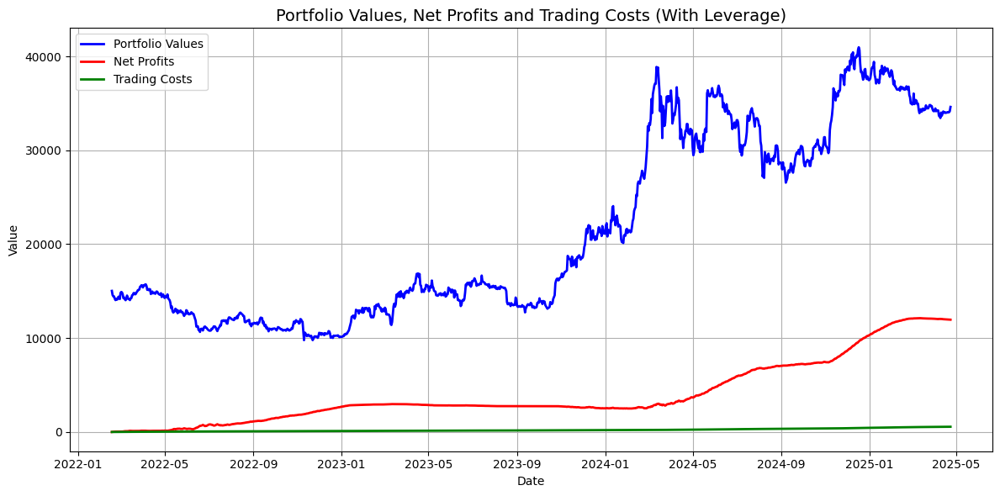

In [16]:
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(data.index, portfoliovalues, label='Portfolio Values', color='blue', linewidth=2)
ax.plot(data.index, netprofits[1:], label='Net Profits', color='red', linewidth=2)
ax.plot(data.index, tradingcosts[1:], label='Trading Costs', color='green', linewidth=2)

ax.set_title("Portfolio Values, Net Profits and Trading Costs (With Leverage)", fontsize=14)
ax.set_xlabel("Date")
ax.set_ylabel("Value")
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()